# This is a notebook for querying the merged Eutro WB for Chl, Oxygen and Nutrients instance for the 1.0.0 Beacon release.

- You can run each cell individually by pressing "shift + enter".
- For more information, questions, bugs, please contact us on Slack:
  - https://join.slack.com/t/beacontechnic-wwa5548/shared_invite/zt-2dp1vv56r-tj_KFac0sAKNuAgUKPPDRg.


#### In order to get access to the Beacon endpoint, you need to fill in your unique personal token between the " " in the cell below.


In [1]:
Token = ""

#### Install the following packages, if you have not already installed them in your environment:

- pip install requests
- pip install xarray
- pip install ipywidgets
- pip install cartopy
- pip install h5netcdf
- pip install netcdf4
- pip install scipy
- pip install packaging


#### Import the required packages


In [2]:
import requests
import json
import xarray as xr
import datetime
import pandas as pd
import os
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt

#### Retrieve the available columns from the Merged Eutrophication endpoint

Swagger page here: https://beacon-wb2-eutrophication.maris.nl/swagger/


In [3]:
responseinfo = requests.get("https://beacon-wb2-eutrophication.maris.nl/api/query/available-columns",
                            headers={"Authorization": f"Bearer {Token}"})

params = responseinfo.json()

#### Below you can search through the available columns by entering text between the brackets of search_columns(" ").


In [4]:
def search_columns(search_term):
    search_term = search_term.lower()
    matches = [col for col in params if search_term in col.lower()]

    if matches:
        print("Matching columns:")
        for match in matches:
            print(match)
    else:
        print("No matching columns found.")


search_columns("PHOS")  # Enter your search term here

Matching columns:
COMMON_PHOSPHATE
COMMON_PHOSPHATE_P01
COMMON_PHOSPHATE_P06
COMMON_PHOSPHATE_QC
COMMON_PHOSPHATE_STANDARD_NAME
COMMON_PHOSPHATE_UNITS
PHOS
PHOS.standard_name
PHOS.units
PHOS_QC
Phosphate
Phosphate.standard_name
Phosphate.units
Phosphate_WODflag
Water body phosphate
Water body phosphate.units
Water body phosphate_qc
Water body total phosphorus
Water body total phosphorus.units
Water body total phosphorus_qc


#### You can define here your input parameters


In [5]:
parameter = "COMMON_PHOSPHATE"  # column name
mindate = "2010-01-01"  # yyyy-mm-dd
maxdate = "2011-01-30"  # yyyy-mm-dd
minlon = -180
maxlon = 180
minlat = -90
maxlat = 90
mindepth = 0
maxdepth = 50

#### This will create the query body based on your input parameters, you can add other "query_parameters" and "filters" to suit your needs.

- For more query examples and explanations, you can take a look at https://github.com/maris-development/beacon-blue-cloud.


In [6]:
def query(parameter, mindate, maxdate, minlon, maxlon, minlat, maxlat, mindepth, maxdepth):
    body = {
        "query_parameters": [
            {
                "column_name": parameter,
                "alias": parameter,
                "skip_fill_values": True
            },
            {
                "column_name": f"{parameter}_UNITS",
                "alias": "Unit"
            },
            {
                "column_name": "COMMON_TIME",
                "alias": "datetime"
            },
            {
                "column_name": f"{parameter}_QC",
                "alias": f"{parameter}_qf"
            },
            {
                "column_name": f"{parameter}_P01",
                "alias": f"{parameter}_P01",
                "optional": True
            },
            {
                "column_name": f"{parameter}_P06",
                "alias": f"{parameter}_P06",
                "optional": True
            },
            {
                "column_name": "COMMON_DEPTH",
                "alias": "DEPTH"
            },
            {
                "column_name": "COMMON_LONGITUDE",
                "alias": "LONGITUDE"
            },
            {
                "column_name": "COMMON_LATITUDE",
                "alias": "LATITUDE"
            },
            {
                "column_name": "SOURCE_BDI",
                "alias": "SOURCE_BDI"
            },
            {
                "column_name": "SOURCE_BDI_DATASET_ID",
                "alias": "SOURCE_BDI_DATASET_ID"
            }
        ],
        "filters": [
            {
                "for_query_parameter": "datetime",
                "min": f"{mindate}T00:00:00",
                "max": f"{maxdate}T00:00:00",
                "cast": "timestamp"
            },
            {
                "for_query_parameter": "DEPTH",
                "min": mindepth,
                "max": maxdepth
            },
            {
                "for_query_parameter": "LONGITUDE",
                "min": minlon,
                "max": maxlon
            },
            {
                "for_query_parameter": "LATITUDE",
                "min": minlat,
                "max": maxlat
            }
        ],
        "output": {
            "format": "ipc"
        }}
    return body


query_body = query(parameter, mindate, maxdate, minlon,
                   maxlon, minlat, maxlat, mindepth, maxdepth)

#### This is the post request that is sent to Beacon with the above specified body.


In [7]:
response = requests.post("https://beacon-wb2-eutrophication.maris.nl/api/query", json.dumps(query_body), headers={
    "Authorization": f"Bearer {Token}",
    "Content-type": "application/json"
})

if response.status_code == 204:
    print("No data has been found for your query, please update your input fields above and run the notebook again.")
elif response.status_code != 200:
    print(response.text)

In [8]:
regionname = f"[{minlat},{minlon}],[{maxlat},{maxlon}]"

if not os.path.exists("./Beacon_V1.0.0_Output"):
    os.makedirs("Beacon_V1.0.0_Output")

open(
    f"./Beacon_V1.0.0_Output/EWB_merged_{parameter}_{regionname}_{mindate}-{maxdate}_[{mindepth}-{maxdepth}m].arrow", "wb").write(response.content)
df = pd.read_feather(
    f"./Beacon_V1.0.0_Output/EWB_merged_{parameter}_{regionname}_{mindate}-{maxdate}_[{mindepth}-{maxdepth}m].arrow")
df = df.assign(datetime=pd.to_datetime(
    df["datetime"])).set_index("datetime").sort_index()
df

,COMMON_PHOSPHATE,Unit,COMMON_PHOSPHATE_qf,COMMON_PHOSPHATE_P01,COMMON_PHOSPHATE_P06,DEPTH,LONGITUDE,LATITUDE,SOURCE_BDI,SOURCE_BDI_DATASET_ID,dataset_id
datetime,,,,,,,,,,,
2010-01-04 00:00:00,2.390000,mmol m-3,1.0,SDN:P01::PHOSZZXX,SDN:P06::UPOX,1.000000,3.565700,51.411999,BEACON-CMEMS-BGC,694,20727
2010-01-04 00:00:00,3.100000,mmol m-3,1.0,SDN:P01::PHOSZZXX,SDN:P06::UPOX,1.000000,3.825500,51.346500,BEACON-CMEMS-BGC,694,20727
2010-01-04 00:00:00,4.000000,mmol m-3,1.0,SDN:P01::PHOSZZXX,SDN:P06::UPOX,1.000000,4.014200,51.436199,BEACON-CMEMS-BGC,694,20727
2010-01-04 07:35:59,0.400000,umol/kg,1,SDN:P01::MDMAP906,SDN:P06::KGUM,0.000000,8.816667,58.383335,BEACON-WOD,11428726,13397
2010-01-04 07:35:59,0.390244,umol/kg,1,SDN:P01::MDMAP906,SDN:P06::KGUM,9.906778,8.816667,58.383335,BEACON-WOD,11428726,13397
...,...,...,...,...,...,...,...,...,...,...,...
2011-01-29 21:24:59,0.590000,mmol m-3,1.0,SDN:P01::PHOSZZXX,SDN:P06::UPOX,20.400000,-5.900300,53.730000,BEACON-CMEMS-BGC,17614,19856
2011-01-29 22:12:00,0.550000,mmol m-3,1.0,SDN:P01::PHOSZZXX,SDN:P06::UPOX,4.420000,-5.752290,53.729198,BEACON-CMEMS-BGC,17614,19856
2011-01-29 22:12:00,0.536585,umol/kg,1,SDN:P01::MDMAP906,SDN:P06::KGUM,4.380598,-5.752333,53.729168,BEACON-WOD,11811080,12051


#### Optionally apply a filter on your parameter for quick removal of outliers. Note that this can also be achieved within your Beacon request by applying a filter on your parameter.


In [9]:
# highbound = 40
# lowbound = -2
# df = df.loc[(df[f"{parameter}"] < highbound) & (df[f"{parameter}"] > lowbound)]
# df
df['SOURCE_BDI'].unique()

array(['BEACON-CMEMS-BGC', 'BEACON-WOD', 'BEACON-EMODNET-CHEMISTRY'],
      dtype=object)

In [10]:
df.head()

,COMMON_PHOSPHATE,Unit,COMMON_PHOSPHATE_qf,COMMON_PHOSPHATE_P01,COMMON_PHOSPHATE_P06,DEPTH,LONGITUDE,LATITUDE,SOURCE_BDI,SOURCE_BDI_DATASET_ID,dataset_id
datetime,,,,,,,,,,,
2010-01-04 00:00:00,2.390000,mmol m-3,1.0,SDN:P01::PHOSZZXX,SDN:P06::UPOX,1.000000,3.565700,51.411999,BEACON-CMEMS-BGC,694,20727
2010-01-04 00:00:00,3.100000,mmol m-3,1.0,SDN:P01::PHOSZZXX,SDN:P06::UPOX,1.000000,3.825500,51.346500,BEACON-CMEMS-BGC,694,20727
2010-01-04 00:00:00,4.000000,mmol m-3,1.0,SDN:P01::PHOSZZXX,SDN:P06::UPOX,1.000000,4.014200,51.436199,BEACON-CMEMS-BGC,694,20727
2010-01-04 07:35:59,0.400000,umol/kg,1,SDN:P01::MDMAP906,SDN:P06::KGUM,0.000000,8.816667,58.383335,BEACON-WOD,11428726,13397
2010-01-04 07:35:59,0.390244,umol/kg,1,SDN:P01::MDMAP906,SDN:P06::KGUM,9.906778,8.816667,58.383335,BEACON-WOD,11428726,13397


#### Plotting of results.


In [11]:
import plotly.express as px

lon = df['LONGITUDE']
lat = df['LATITUDE']
field = df[f'{parameter}']
depth = df['DEPTH']

# fig = px.scatter_mapbox(df, lon=lon, lat=lat, color=field, hover_name=df['Depth'], color_continuous_scale = px.colors.sequential.Rainbow, zoom=3, height=500)
fig = px.scatter_mapbox(df, lon=lon, lat=lat, color=field, size=depth, size_max=10, hover_data=f'{parameter}_qf',
                        hover_name=df['SOURCE_BDI'], color_continuous_scale=px.colors.sequential.Rainbow, zoom=3, height=800)
fig.update_layout(
    title=dict(
        text=f'EWB_Merged_Beacon_instance {parameter} {regionname} {mindate}-{maxdate} [{mindepth}-{maxdepth}m] #Points = {len(df)}'),
    mapbox_style="white-bg",
    mapbox_layers=[
        {
            "below": 'traces',
            "sourcetype": "raster",
            "sourceattribution": "United States Geological Survey",
            "source": [
                "https://basemap.nationalmap.gov/arcgis/rest/services/USGSImageryOnly/MapServer/tile/{z}/{y}/{x}"
            ]
        }
    ])

fig.show()

In [12]:
print(min(lon))
print(max(lon))
print(min(lat))
print(max(lat))

-158.05799865722656
165.07730102539062
-71.1084976196289
81.0790023803711


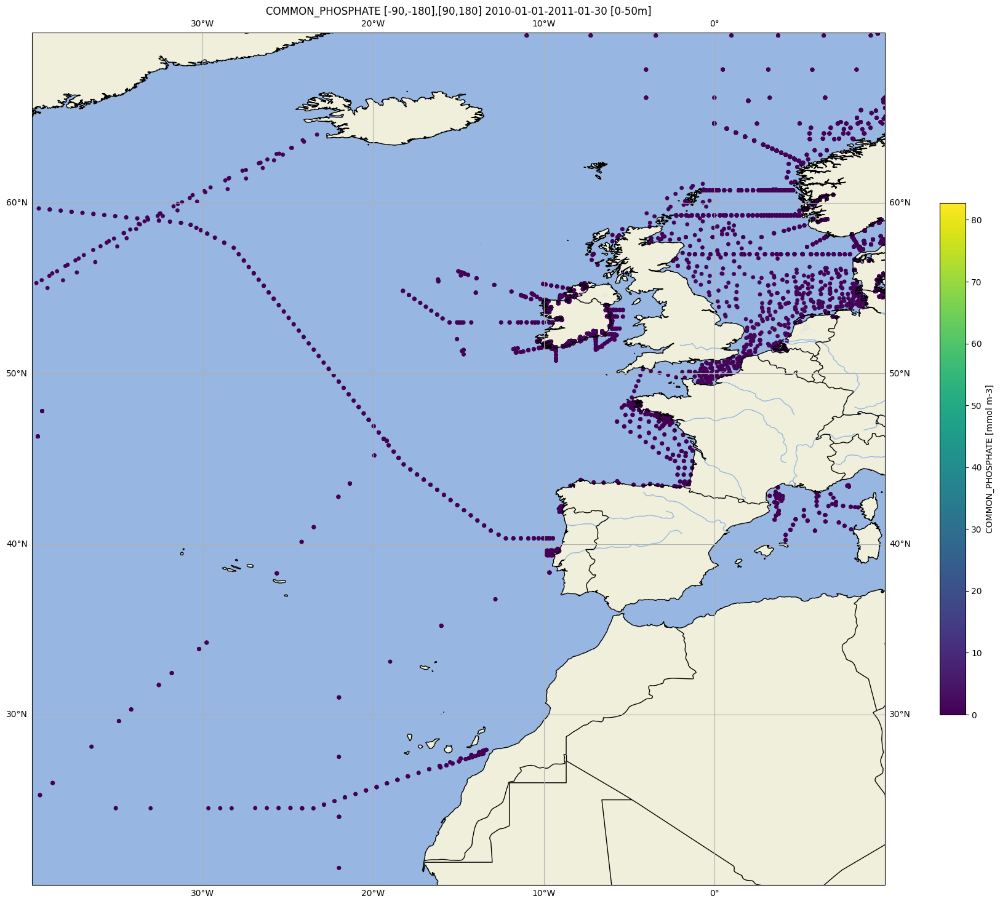

In [13]:
fig = plt.figure(figsize=(23, 18))
ax = plt.axes(projection=ccrs.PlateCarree())

# (west, east, south, north)
ax.set_extent([-40, 10, 20, 70], crs=ccrs.PlateCarree())

ax.coastlines(resolution="10m")
ax.gridlines(draw_labels=True)

sc = ax.scatter(df["LONGITUDE"], df["LATITUDE"], c=df[parameter],
                cmap="viridis", s=15, transform=ccrs.PlateCarree())

ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.RIVERS)
ax.add_feature(cfeature.BORDERS)
ax.add_feature(cfeature.LAKES, alpha=0.1)

cbar = plt.colorbar(sc, ax=ax, orientation="vertical",
                    shrink=0.6, label="Value Set 1")
cbar.set_label(f"{parameter} [{df['Unit'].iloc[0]}]")

plt.title(
    f"{parameter} {regionname} {mindate}-{maxdate} [{mindepth}-{maxdepth}m]")

plt.show()